# Quantization Aware Training (QAT)

References:

- [Quantization (PyTorch documentation)](https://pytorch.org/docs/stable/quantization.html)
- [`train_quantization.py` (Torchvision reference code)](https://github.com/pytorch/vision/blob/main/references/classification/train_quantization.py)

In [1]:
import os
import sys
from pathlib import Path

import intel_extension_for_pytorch as ipex
import torch
import torch.nn as nn
import torch.optim as optim
from matplotlib import pyplot as plt
from PIL import Image
from torch import Tensor
from torch.nn import functional as F
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import ExponentialLR, StepLR
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, Resize, ToTensor
from tqdm import tqdm


sys.path.append(os.fspath(Path.cwd().parent.resolve()))

/home/xuanghdu/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: ''If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
from anime4k_torch.demo_dataset import SuperResolutionDataset
from anime4k_torch.metric import yuv_error
from anime4k_torch.srcnn import SRCNNModel
from anime4k_torch.training import eval_loop, train_loop
from anime4k_torch.visualization import show_images

In [3]:
# qconfig = torch.ao.quantization.get_default_qat_qconfig("onednn")
qconfig = torch.ao.quantization.get_default_qat_qconfig("x86")

# fbgemm

model = SRCNNModel(input_depth=3, qconfig=qconfig)
if torch.cuda.is_available():
    device = "cuda"
else:
    # device = "cpu"
    device = "xpu"

model.to(device)

model = torch.ao.quantization.prepare_qat(model)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

/home/xuanghdu/.local/lib/python3.10/site-packages/torch/ao/quantization/observer.py:214: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warnings.warn(


In [23]:
prefix = "../../data/demo/"
high_res_folder = "720p"
train_folders = ["360p"]
# train_folders = ["360p", "270p", "216p", "180p"]
# train_folders = ["360p", "270p", "216p", "180p", "135p", "108p", "90p", "72p"]


transform = Compose([
    ToTensor(),
])

dataloader_config = {"batch_size": 32, "num_workers": 8, "pin_memory": True, "shuffle": True}

train_datasets = [SuperResolutionDataset(prefix+folder, prefix+high_res_folder, transform) for folder in train_folders]
train_dataloaders = [DataLoader(dataset, **dataloader_config) for dataset in train_datasets]
# criterion = yuv_error
criterion = nn.MSELoss()

num_epochs = 3
model.to(device)

# scheduler = ExponentialLR(optimizer, 0.9)

for i, dataloader in enumerate(train_dataloaders):
    for epoch in range(num_epochs):
        for batch in tqdm(dataloader):
            low_res_images = batch["low_res"].to(device)
            high_res_images = batch["high_res"].to(device)
            outputs = model(low_res_images)
            loss = criterion(outputs, high_res_images)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # scheduler.step()

        print(f"{train_folders[i]} Loss: {loss.item()}")

    model.cpu()
    model.eval()
    model_converted = torch.ao.quantization.convert(model)
    torch.save(model_converted.state_dict(), f"srcnn_{train_folders[i]}_3.pth")

    model.to(device)

100%|██████████| 60/60 [00:20<00:00,  2.92it/s]


360p Loss: 0.0011306335218250751


100%|██████████| 60/60 [00:19<00:00,  3.11it/s]


360p Loss: 0.0014114893274381757


100%|██████████| 60/60 [00:19<00:00,  3.08it/s]

360p Loss: 0.0016494508599862456


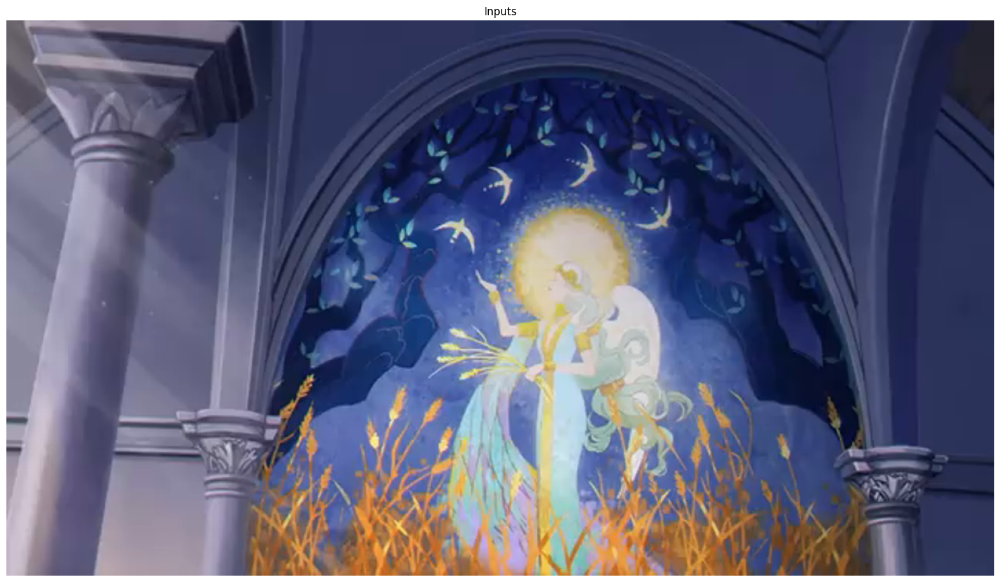

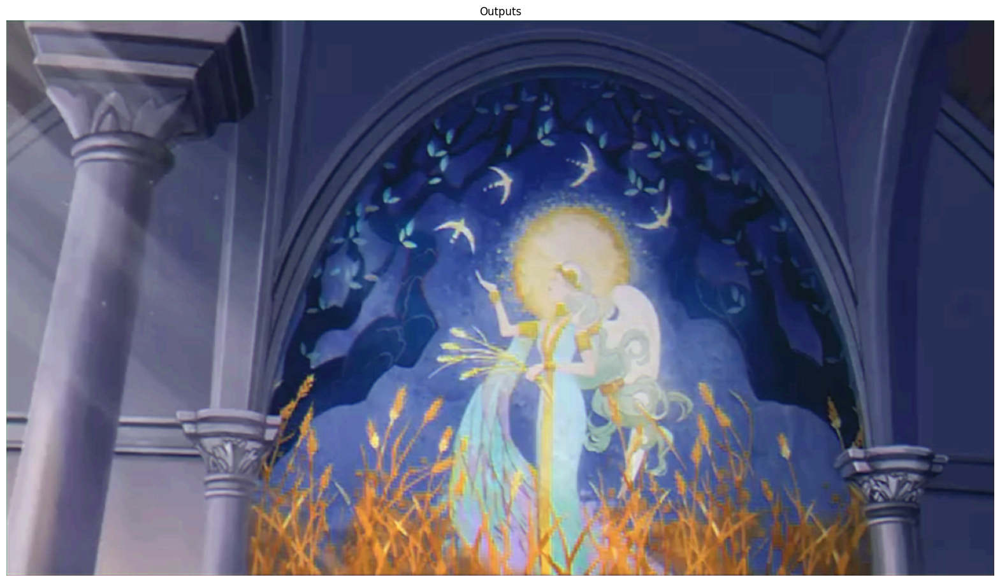

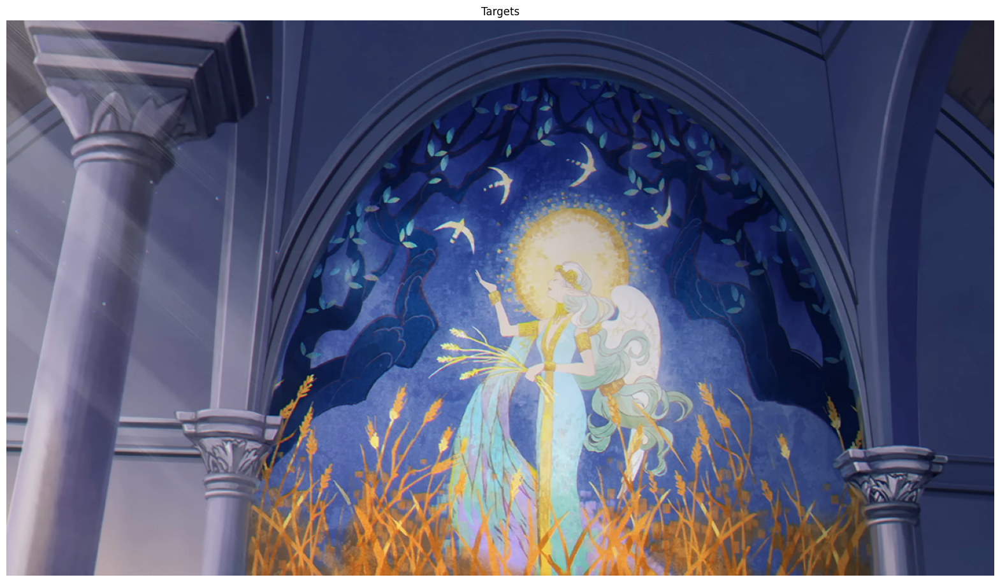

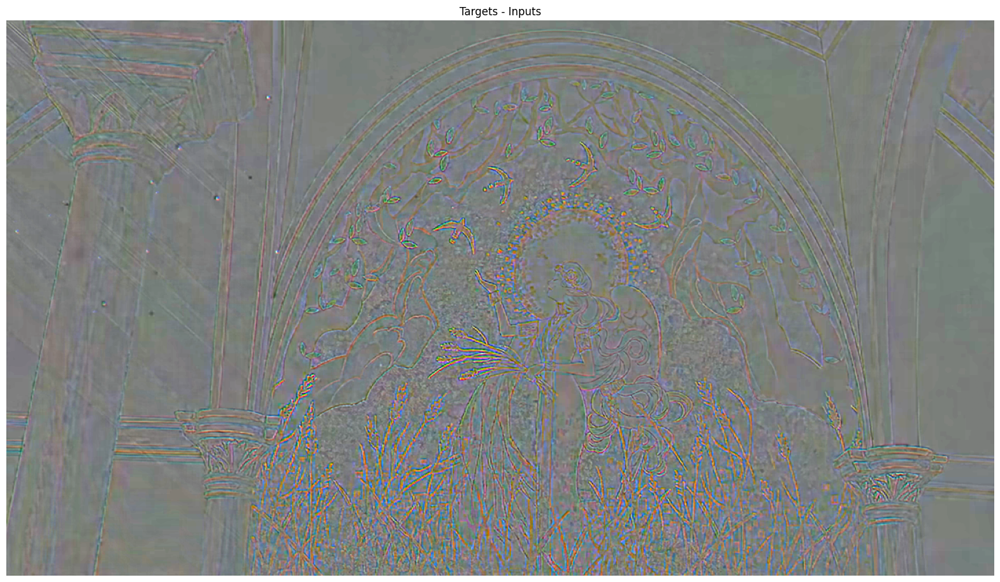

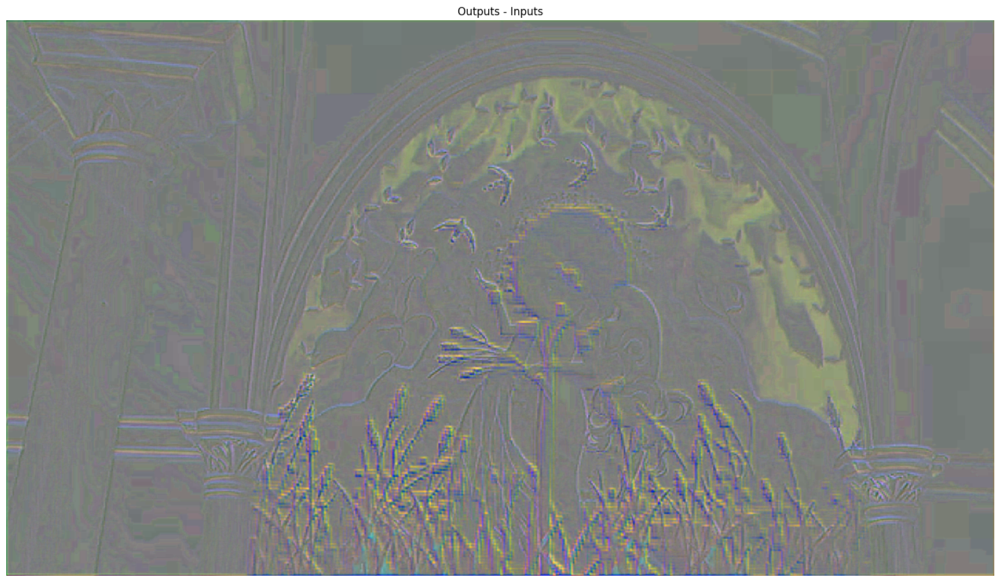

In [21]:
from matplotlib import pyplot as plt

# model = SRCNNModel()
# mode = torch.ao.quantization.convert(model)
# model_converted.load_state_dict(torch.load("srcnn_360p_3.pth"))

model.eval()
model.to(device)

figsize = (20, 20)

dataloader = train_dataloaders[0]
for batch in dataloader:
    low_res_images = batch["low_res"].to(device)
    high_res_images = batch["high_res"].to(device)
    outputs = model(low_res_images)

    low_res_images = low_res_images[:1]
    high_res_images = high_res_images[:1]
    outputs = outputs[:1]

    figure = plt.figure(figsize=figsize)
    show_images(figure, low_res_images)
    figure.axes[0].set_title("Inputs")

    figure = plt.figure(figsize=figsize)
    show_images(figure, outputs)
    figure.axes[0].set_title("Outputs")

    figure = plt.figure(figsize=figsize)
    show_images(figure, high_res_images)
    figure.axes[0].set_title("Targets")

    # upsampled_inputs = F.interpolate(inputs, scale_factor=1, mode="bilinear")

    figure = plt.figure(figsize=figsize)
    show_images(figure, high_res_images - low_res_images, value_range=(-0.2, 0.2))
    figure.axes[0].set_title("Targets - Inputs")

    figure = plt.figure(figsize=figsize)
    show_images(figure, outputs - low_res_images, value_range=(-0.2, 0.2))
    figure.axes[0].set_title("Outputs - Inputs")


    break


In [ ]:
# data_dir = Path("../../data/anime-xuanghdu").resolve()
# dataloader_config = {"batch_size": 32, "num_workers": 8, "pin_memory": True}

# # resize = (720, 1280)
# crop_size = 1080


# def transform_train(image) -> Tensor:
#     return transform_image_train(image, random_crop_size=crop_size, scale_factor=1)
#     # return transform_image_train(image, resize=resize, random_crop_size=crop_size)


# def transform_validation(image) -> Tensor:
#     return transform_image_eval(image, center_crop_size=crop_size, scale_factor=1)
#     # return transform_image_eval(image, resize=resize, center_crop_size=crop_size)


# train_set = NpyDataset(data_dir / "train.npy", transform_train)
# train_loader = DataLoader(train_set, shuffle=True, drop_last=True, **dataloader_config)

# validation_set = NpyDataset(data_dir / "validation.npy", transform_validation)
# validation_loader = DataLoader(validation_set, **dataloader_config)

In [ ]:
# checkpoint_dir = Path("../checkpoints").resolve()
# checkpoint_dir.mkdir(exist_ok=True)

In [ ]:
# train_losses = []

# # Super-convergence with clipping
# # optimizer = SGD(model.parameters(), lr=1e1, momentum=0.9, nesterov=True)
# # train_losses.extend(
# #     train_loop(model, optimizer, yuv_error, train_loader, epochs=1, clip_grad_norm=1e-8)
# # )
# # validation_loss = eval_loop(model, yuv_error, validation_loader)
# # print("Validation loss:", validation_loss)

# # Fine tuning with Adam
# clip_grad_norm = None
# for learning_rate in 1e-2, 5e-3, 3.5e-3, 1e-3, 5e-4:
# # for learning_rate in 1e-2, 5e-3:
#     optimizer = Adam(model.parameters(), learning_rate)
#     train_losses.extend(
#         train_loop(
#             model,
#             optimizer,
#             yuv_error,
#             train_loader,
#             epochs=2,
#             clip_grad_norm=clip_grad_norm,
#         )
#     )
#     validation_loss = eval_loop(model, yuv_error, validation_loader)
#     print("Validation loss:", validation_loss)


In [ ]:
# # load quantized model

# model_converted = torch.ao.quantization.convert(model)
# model_converted.load_state_dict(torch.load("srcnn_i8_10.pth"))

y = A conv x + b

(m) = (m, n) * (n) + (m)

Z = ReLU(y)

y' * y_scale = A_q A_scale x' x_scale + b

x' = x_q - x_0

y' = y_q - y_0

z' = z_q - z_0

y' = (A_scale * x_scale / y_scale) * A_q * x' + b

Given a constant s, approximate

u * 2^{-s} = A_scale * x_scale / y_scale

v * 2^{-s} = b / y_scale

y' = (A_q * u * x' + v) * 2^{-s}

bais: 37

weight: s=20

activiation: 10

In [ ]:
with torch.inference_mode():
    model.cpu()
    model.eval()
    model_converted = torch.ao.quantization.convert(model)

In [ ]:
model_converted
# model_converted.state_dict().keys()

In [22]:
# s = [20, 20, 20]
s = [16, 16, 16]

u = []
v = []
weights = []

x_scales = ["quant.scale", "conv_layers.0.scale", "conv_layers.1.scale"]
x_zero_points = ["quant.zero_point", "conv_layers.0.zero_point", "conv_layers.1.zero_point"]

# x = model_converted.quant(inputs).int_repr()

for i, x_scale in enumerate(x_scales):
    conv_layers_weight = model_converted.state_dict()["conv_layers.{}.weight".format(i)]
    bias = model_converted.state_dict()["conv_layers.{}.bias".format(i)]

    x_scale = model_converted.state_dict()[x_scale]
    y_scale = model_converted.state_dict()["conv_layers.{}.scale".format(i)]
    A_scale = conv_layers_weight.q_per_channel_scales()

    u.append(x_scale / y_scale * A_scale * (2 ** s[i]))
    v.append((bias / y_scale) * (2 ** s[i]))

    A_q = conv_layers_weight.int_repr()
    x_0 = model_converted.state_dict()[x_zero_points[i]]

    weights.append(A_q * u[i].unsqueeze(-1).unsqueeze(-1).unsqueeze(-1))

    # x = F.relu(F.conv2d(x.double(), weights[i], v[i].double(), stride=1, padding=1) * (2 ** -s[i]))

weights[0] = weights[0] / 255 / model_converted.state_dict()["quant.scale"]
weights[2] = weights[2] * 255 * y_scale

import pickle

with open("weights.pkl", "wb") as f:
    pickle.dump(weights, f)

with open("biases.pkl", "wb") as f:
    pickle.dump(v, f)

weights = pickle.load(open("weights.pkl", "rb"))
v = pickle.load(open("biases.pkl", "rb"))

In [ ]:
# for i in range(1):
#     for j in range(1920):
#         print(x_input[0, :, i, j]*255)


tensor(True) tensor(True)
tensor(True) tensor(True)
tensor(True) tensor(True)


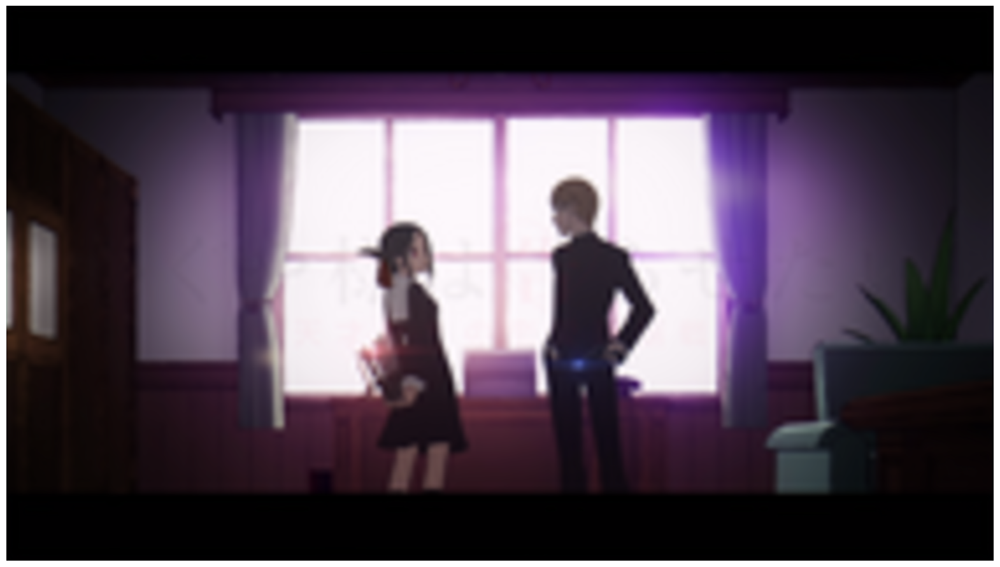

In [15]:
from PIL import Image
image = Image.open("0007_10.png")
image = image.convert("RGB")
import numpy as np
x_input = torch.tensor(np.array(image))
x_input = x_input.permute(2, 0, 1).unsqueeze(0).float()

x_input *= 64

# x_input = x_input*255
for i in range(3):
    output = F.conv2d(x_input.double().round(), weights[i].round(), v[i].double().round(), stride=1, padding=1) * (2 ** -s[i])
    print(output.max() < 2**15, output.min() > -2**15)
    x_input = F.relu(output)
x_input = x_input/255

# x_input = torch.clamp(x_input, 0, 1)

x_input /= 64

figure = plt.figure(figsize=figsize)
show_images(figure, x_input)


In [ ]:
for weight in weights:
    print(weight.max(), weight.min())
    print(weight.max() > 2**24, weight.min() < -2**24)
    # print(weight.shape)

In [ ]:
for bias in v:
    print(bias.max(), bias.min())
    # print(bias.max() > 2**40, bias.min() < -2**40)

In [ ]:
# conv_output_quint8 = model_converted.conv_layers[0](model_converted.quant(inputs))
# F.relu(conv_output_quint8.int_repr() - conv_output_quint8.q_zero_point())

input_quint8 = model_converted.quant(inputs)
conv1_weight = model_converted.state_dict()['conv_layers.0.weight']
conv1_bias = model_converted.state_dict()['conv_layers.0.bias']

input_2 = F.relu(F.conv2d(input_quint8.dequantize(), conv1_weight.dequantize(), conv1_bias, stride=1, padding=1))
conv2_weight = model_converted.state_dict()['conv_layers.1.weight']
conv2_bias = model_converted.state_dict()['conv_layers.1.bias']

intput_3 = F.relu(F.conv2d(input_2, conv2_weight.dequantize(), conv2_bias, stride=1, padding=1))
conv3_weight = model_converted.state_dict()['conv_layers.2.weight']
conv3_bias = model_converted.state_dict()['conv_layers.2.bias']

output = F.conv2d(intput_3, conv3_weight.dequantize(), conv3_bias, stride=1, padding=1)
output


In [ ]:
# input_quint8 = model_converted.quant(inputs)

# # conv_output_quint8 = model_converted.conv_layers[0](input_quint8)

# # input: input_quint8

# conv1_weight = model_converted.state_dict()['conv_layers.0.weight']
# conv1_bias = model_converted.state_dict()['conv_layers.0.bias']

# conv_output_float = F.conv2d(input_quint8.dequantize(), conv1_weight.dequantize(), conv1_bias, stride=1, padding=1)

# conv_output_quint8_calc = conv_output_float / model_converted.conv_layers[0].scale + model_converted.conv_layers[0].zero_point


# # relu1 = F.relu(conv_output_quint8)
# # conv_output_quint8_2 = model_converted.conv_layers[1](relu1)
# # relu2 = F.relu(conv_output_quint8_2)
# # conv_output_quint8_3 = model_converted.conv_layers[2](relu2)
# # output_quint8 = model_converted.dequant(conv_output_quint8_3)

# conv_output_quint8 = model_converted.conv_layers[0](input_quint8)

# ret = F.conv2d(conv_output_quint8.int_repr().float(), model_converted.state_dict()['conv_layers.1.weight'].int_repr().float())

# # ret.max() - ret.min() # ~256^2

# model_converted.state_dict()['conv_layers.1.weight'].int_repr().shape
# conv_output_quint8.int_repr().shape
# conv_output_float = conv_output_quint8.dequantize()

# (conv_output_quint8.int_repr() - conv_output_quint8.q_zero_point()) * conv_output_quint8.q_scale()

# conv_output_quint8

# 1 / model_converted.state_dict()['quant.scale']

# # input: float (0, 1) / quant.scale => input_int: int [0, 127]

# # input_int: int [0, 127] conv with conv.weight: int => output_int: int

# # output_int: int * conv.q_per_channel_scales (assuming zero_point is 0) => output_float: float

# # output_float: float / conv.scale + conv.zero_point => output_conv: int

# model_converted.state_dict().keys()

# conv1 = model_converted.state_dict()['conv_layers.0.weight']
# conv1

# conv1.q_per_channel_zero_points()
# conv1.q_per_channel_scales()
# conv1.int_repr() * (conv1.q_per_channel_scales()).unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)

In [ ]:
plt.plot(train_losses)
plt.yscale("log")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
None  # Suppress output.

In [ ]:
# # print min and max of outputs

# print(outputs.min(), outputs.max())
# print(inputs.min(), inputs.max())
# print(targets.min(), targets.max())

In [ ]:
figsize = (20, 20)
model_converted.cpu()

with torch.inference_mode():
    inputs, targets = next(iter(DataLoader(train_set, batch_size=2)))
    model_converted.eval()
    outputs = model_converted(inputs)

figure = plt.figure(figsize=figsize)
show_images(figure, inputs)
figure.axes[0].set_title("Inputs")

figure = plt.figure(figsize=figsize)
show_images(figure, targets)
figure.axes[0].set_title("Targets")

figure = plt.figure(figsize=figsize)
show_images(figure, outputs)
figure.axes[0].set_title("Outputs")

upsampled_inputs = F.interpolate(inputs, scale_factor=1, mode="bilinear")

figure = plt.figure(figsize=figsize)
show_images(figure, targets - upsampled_inputs, value_range=(-0.2, 0.2))
figure.axes[0].set_title("Targets - Inputs")

figure = plt.figure(figsize=figsize)
show_images(figure, outputs - upsampled_inputs, value_range=(-0.2, 0.2))
figure.axes[0].set_title("Outputs - Inputs")

None  # Suppress output.

In [ ]:
print(model)
print(
    "Number of conv parameters:",
    sum(v.numel() for k, v in model.state_dict().items() if k.endswith(".weight")),
)

In [ ]:
# #!/bin/bash

# # Loop through all video files in the current directory
# for file in *.mp4 *.avi *.mov; do
#     # Check if the file exists
#     if [ -e "$file" ]; then
#         # Extract the base filename and extension
#         filename=$(basename "$file")
#         extension="${filename##*.}"
#         filename="${filename%.*}"

#         # Resize the video to 10% of its original size and scale it back to the original size
#         ffmpeg -i "$file" -vf "scale=iw*0.1:ih*0.1,scale=iw*10:ih*10" "${filename}_10.${extension}"

#         echo "Processed $file"
#     fi
# done

In [ ]:
# for file in *.png; do
#     if [ -e "$file" ]; then
#         filename=$(basename "$file" .png)
#         convert "$file" -resize 10% -resize 1000% "${filename}_10.png"
#         echo "Processed $file"
#     fi
# done